In [1]:
%matplotlib inline
%config InlineBackend.figure_format = "retina"

# Import standard libraries
import os, sys
import numpy as np
import scipy as sp
import matplotlib as mpl
import matplotlib.pyplot as plt
import copy
import astropy.units as u
import emcee, corner
import seaborn as sns
import pandas as pd

import chimera

import coronagraph as cg
import smart
import smarter; smarter.utils.plot_setup()

/Users/lustija1/opt/anaconda3/lib/python3.8/site-packages/pysynphot/locations.py:345: UserWarning: Extinction files not found in /Users/lustija1/Documents/PandExo_data/pysynphot_data/extinction
  warnings.warn('Extinction files not found in %s' % (extdir, ))
/Users/lustija1/opt/anaconda3/lib/python3.8/site-packages/pysynphot/refs.py:117: UserWarning: No graph or component tables found; functionality will be SEVERELY crippled. No files found for /Users/lustija1/Documents/PandExo_data/pysynphot_data/mtab/*_tmg.fits
  warnings.warn('No graph or component tables found; '
/Users/lustija1/opt/anaconda3/lib/python3.8/site-packages/pysynphot/refs.py:124: UserWarning: No thermal tables found, no thermal calculations can be performed. No files found for /Users/lustija1/Documents/PandExo_data/pysynphot_data/mtab/*_tmt.fits
  warnings.warn('No thermal tables found, '


In [3]:
def extract_flatchain(ep, tag, iburn, mad_cut = None):
    
    # Create useful things
    emcee_backend = str(tag) + "_emcee.h5"
    theta_names = ep.THETA_NAMES
    theta0 = ep.THETA0

    # Create an HDF5 backend
    backend = emcee.backends.HDFBackend(emcee_backend)
   
    if mad_cut is None:
        
        # Use all walkers
        flatchain = backend.get_chain(flat=True, discard = iburn)
        
        # Mask for all walkers
        m = np.array([True for _ in range(backend.shape[0])])
        
    else:
        
        # Index of parameter to apply mad cut
        imad = mad_cut[0]
        
        # Number of mads away from median at which to cut
        nmad = mad_cut[1]
        
        # Cut chains by the MAD 
        chain = backend.get_chain(flat=False, discard = iburn)
        tmp = np.median(chain, axis=0)[:,imad]
        #np.median(tmp), np.median(np.fabs(tmp - np.median(tmp)))
        m = np.fabs(tmp - np.median(tmp)) < nmad*np.median(np.fabs(tmp - np.median(tmp)))
        flatchain = chain[:,m,:].reshape((-1, len(theta_names)))
        
    print("using", m.sum(), "of",  m.size, "walkers")
    
    wl = np.array(ep.wl)
    y_binned = np.array(ep.y_binned)
    y_meas = np.array(ep.y_meas)
    y_err = np.array(ep.y_err)
        
    # Get spectra
    blobs = backend.get_blobs(flat=False, discard = iburn)
    Fobs_post, Fstar_post, Fplan_post = blobs[:,m,0,:].reshape((-1, len(ep.wl))), blobs[:,m,1,:].reshape((-1, len(ep.wl))), blobs[:,m,2,:].reshape((-1, len(ep.wl)))

    return flatchain, dict(wl=wl, y_binned=y_binned, y_meas=y_meas, y_err=y_err, 
                           Fobs_post=Fobs_post, Fstar_post=Fstar_post, Fplan_post=Fplan_post)


In [3]:
#from run_wasp43_mcmc_niriss import exopie as exopie_niriss; tag = "test_niriss1"; iburn=400
from run_wasp43_free_niriss1 import exopie as exopie_niriss; tag = "test_free_niriss1"; iburn=1000
chain_niriss, spectra_niriss = extract_flatchain(exopie_niriss, tag, iburn, mad_cut=None)

Loading Synthetic Data and xsecs...
Loading Synthetic Data and xsecs...
Loading Synthetic Data and xsecs...
using 140 of 140 walkers


In [4]:
#from run_wasp43_mcmc_nirspec import exopie as exopie_nirspec; tag = "test_nirspec1"; iburn=500
from run_wasp43_free_nirspec1 import exopie as exopie_nirspec; tag = "test_free_nirspec1"; iburn=1000
chain_nirspec, spectra_nirspec = extract_flatchain(exopie_nirspec, tag, iburn, mad_cut=None)

Loading Synthetic Data and xsecs...
using 140 of 140 walkers


In [5]:
#from run_wasp43_mcmc_mirilrs import exopie as exopie_mirilrs; tag = "test_mirilrs1"; iburn=500
from run_wasp43_free_miri1 import exopie as exopie_mirilrs; tag = "test_free_miri1"; iburn=3000
chain_mirilrs, spectra_mirilrs = extract_flatchain(exopie_mirilrs, tag, iburn, mad_cut=None)

Loading Synthetic Data and xsecs...
using 140 of 140 walkers


In [7]:
#from run_wasp43_mcmc_allin import exopie as exopie_all; tag = "test_allin1"; iburn=3200
from run_wasp43_free_allin import exopie as exopie_all; tag = "test_free_allin1"; iburn=1000
chain_all, spectra_all = extract_flatchain(exopie_all, tag, iburn, mad_cut=None)

using 140 of 140 walkers


In [8]:
#from run_wasp43_mcmc_texp import exopie as exopie_all4; tag = "test_allin4"; iburn=2000
from run_wasp43_free_allin4 import exopie as exopie_all4; tag = "test_free_allin4"; iburn=1000
chain_all4, spectra_all4 = extract_flatchain(exopie_all4, tag, iburn, mad_cut=None)

Loading Synthetic Data and xsecs...
using 140 of 140 walkers


In [32]:
import run_wasp43_free_allinpt25_nontrans; tag = "test_free_allinpt25_nontrans"; iburn=1000
exopie_nontrans_025 = run_wasp43_free_allinpt25_nontrans.exopie
chain_nontran025, spectra_nontran025 = extract_flatchain(exopie_nontrans_025, tag, iburn, mad_cut=None)

using 140 of 140 walkers


In [7]:
import run_wasp43_free_allin1_nontrans; tag = "test_free_allin1_nontrans"; iburn=1000
exopie_nontrans_1 = run_wasp43_free_allin1_nontrans.exopie
chain_nontran1, spectra_nontran1 = extract_flatchain(exopie_nontrans_1, tag, iburn, mad_cut=None)

Loading Synthetic Data and xsecs...
using 140 of 140 walkers


In [34]:
import run_wasp43_free_allin4_nontrans; tag = "test_free_allin4_nontrans"; iburn=1000
exopie_nontrans_4 = run_wasp43_free_allin4_nontrans.exopie
chain_nontran4, spectra_nontran4 = extract_flatchain(exopie_nontrans_4, tag, iburn, mad_cut=None)

using 140 of 140 walkers


In [4]:
import run_wasp43_free_niriss1_nontrans; tag = "test_free_niriss1_nontrans"; iburn=1000
exopie_nontrans_niriss1 = run_wasp43_free_niriss1_nontrans.exopie
chain_nontran_niriss1, spectra_nontran_niriss1 = extract_flatchain(exopie_nontrans_niriss1, tag, iburn, mad_cut=None)

Loading Synthetic Data and xsecs...
Loading Synthetic Data and xsecs...
Loading Synthetic Data and xsecs...
using 140 of 140 walkers


In [5]:
import run_wasp43_free_nirspec1_nontrans; tag = "test_free_nirspec1_nontrans"; iburn=1000
exopie_nontrans_nirspec1 = run_wasp43_free_nirspec1_nontrans.exopie
chain_nontran_nirspec1, spectra_nontran_nirspec1 = extract_flatchain(exopie_nontrans_nirspec1, tag, iburn, mad_cut=None)

Loading Synthetic Data and xsecs...
using 140 of 140 walkers


In [6]:
import run_wasp43_free_miri1_nontrans; tag = "test_free_miri1_nontrans"; iburn=1000
exopie_nontrans_miri1 = run_wasp43_free_miri1_nontrans.exopie
chain_nontran_miri1, spectra_nontran_miri1 = extract_flatchain(exopie_nontrans_miri1, tag, iburn, mad_cut=(0,10.0))

Loading Synthetic Data and xsecs...
using 138 of 140 walkers


## Corner Plot

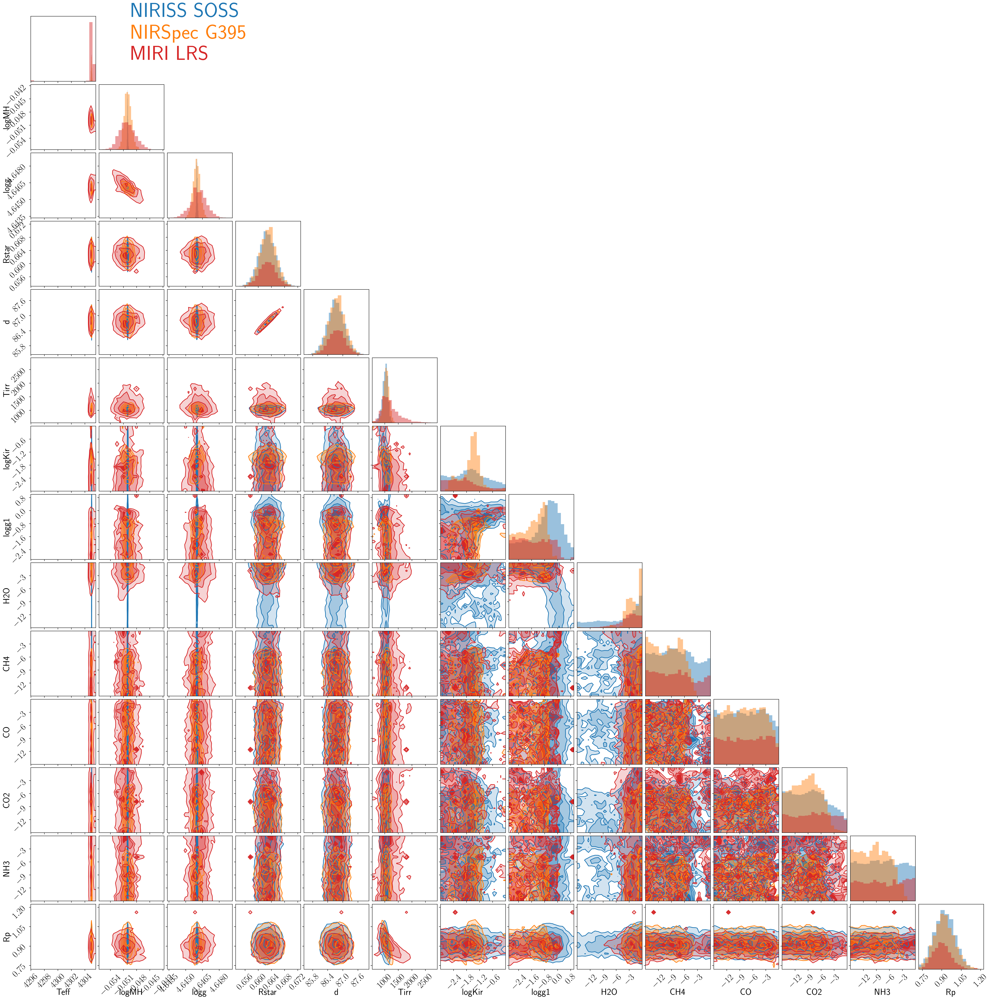

In [9]:
color1 = "C0"
color2 = "C1"
color3 = "C3"
title1 = "NIRISS SOSS"
title2 = "NIRSpec G395"
title3 = "MIRI LRS"
smooth = None
labels = exopie_niriss.THETA_NAMES

fig = corner.corner(chain_niriss, color = color1, labels = labels, show_titles = True, scale_hist=True,
                    plot_contours=True, plot_points = True, plot_density = True, 
                    hist_kwargs = {"alpha" : 0.45, "histtype" : "stepfilled"}, 
                    no_fill_contours=True, plot_datapoints=False, fill_contours=True, 
                    smooth = smooth)

# Save the titles and ylims for the first corner
ndim = len(labels)
axes = np.reshape(fig.axes, (ndim, ndim))
fig_titles = []
fig_ylims = []
for i in range(ndim):
    for j in range(ndim):
        if i == j:
            #print(axes[i,j].get_title()) 
            #print(axes[i,j].get_ylim())
            fig_titles.append(axes[i,j].get_title())
            fig_ylims.append(axes[i,j].get_ylim())
        else:
            pass

fig = corner.corner(chain_nirspec, fig = fig, color = color2, 
                    labels = labels, show_titles = True, scale_hist=True,
                    plot_contours=True, plot_density = True, 
                    hist_kwargs = {"alpha" : 0.45, "histtype" : "stepfilled", "lw" : 1.0, "ls" : "-"}, 
                    no_fill_contours=True, plot_datapoints=False, fill_contours=True, 
                    smooth = smooth)

# Save the titles and ylims for the second corner
axes = np.reshape(fig.axes, (ndim, ndim))
fig_titles2 = []
fig_ylims2 = []
for i in range(ndim):
    for j in range(ndim):
        if i == j:
            #print(axes[i,j].get_title()) 
            #print(axes[i,j].get_ylim())
            fig_titles2.append(axes[i,j].get_title())
            fig_ylims2.append(axes[i,j].get_ylim())
        else:
            pass

fig = corner.corner(chain_mirilrs, fig = fig, color = color3, 
                    labels = labels, show_titles = True, scale_hist=True,
                    plot_contours=True, plot_density = True, 
                    hist_kwargs = {"alpha" : 0.45, "histtype" : "stepfilled", "lw" : 1.0, "ls" : "-"}, 
                    no_fill_contours=True, plot_datapoints=False, fill_contours=True, 
                    smooth = smooth)


# Save the titles and ylims for the second corner
axes = np.reshape(fig.axes, (ndim, ndim))
fig_titles3 = []
fig_ylims3 = []
for i in range(ndim):
    for j in range(ndim):
        if i == j:
            #print(axes[i,j].get_title()) 
            #print(axes[i,j].get_ylim())
            fig_titles3.append(axes[i,j].get_title())
            fig_ylims3.append(axes[i,j].get_ylim())
        else:
            pass

# Make title
fig.text(2.0 / (ndim+1), 1.0 - 0.3*(0./ndim), title1, color = color1, ha = "left", va = "top", fontsize = 45)
fig.text(2.0 / (ndim+1), 1.0 - 0.3*(1./ndim), title2, color = color2, ha = "left", va = "top", fontsize = 45)
fig.text(2.0 / (ndim+1), 1.0 - 0.3*(2./ndim), title3, color = color3, ha = "left", va = "top", fontsize = 45)

ymaxes = np.max(np.array((fig_ylims, fig_ylims2, fig_ylims3)), axis=0)[:,1]

# Make merge titles along diagonal 
axes = np.reshape(fig.axes, (ndim, ndim))
for i in range(ndim):
    for j in range(ndim):
        if i == j:
            #print(axes[i,j].get_title()) 
            #print(axes[i,j].get_ylim())
            text = axes[i,j].get_title()
            text += "\n" + fig_titles[i]
            text += "\n" + fig_titles2[i]
            #axes[i,j].set_title(text, fontsize = 18)
            #t1 = axes[i,j].text(0.0, 1.175, axes[i,j].get_title(), ha = "left", va = "bottom", color = color2, transform = axes[i,j].transAxes)
            #t2 = axes[i,j].text(0.0, 1.175, fig_titles[i], ha = "left", va = "top", color = color1, transform = axes[i,j].transAxes)
            #t3 = axes[i,j].text(0.0, 1.175, fig_titles2[i], ha = "left", va = "top", color = color3, transform = axes[i,j].transAxes)
            text = None
            axes[i,j].set_title(text, fontsize = 18)
            axes[i,j].set_ylim(bottom = 0.0, top = ymaxes[i])
        else:
            pass
        
#fig.savefig(retrieval_miri.tag+"_corner_compare.png", bbox_inches = "tight")
#fig.savefig(retrieval_nirspec.tag+"_corner_compare.png", bbox_inches = "tight")

## 1D Marginal Histograms

findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.


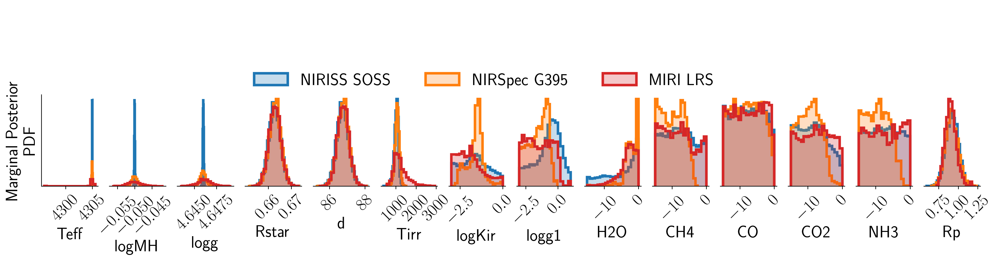

In [10]:
title1 = "NIRISS SOSS"
title2 = "NIRSpec G395"
title3 = "MIRI LRS"
labels = exopie_niriss.THETA_NAMES
truths = exopie_niriss.THETA0

fig, axes = plt.subplots(1, len(labels), figsize = (20, 2))

for i in range(len(labels)):
    ax = axes[i]
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.set_yticks([])
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)
    
    ax.set_xlabel(labels[i])
    #ax.set_title(r1.theta_names[i])
    
    if i > 0:
        ax.spines["left"].set_visible(False)
    else:
        ax.set_ylabel("Marginal Posterior \nPDF")
        #ax.set_title("WASP-43 b Nightside Constraints", loc="left")
    
    #ax.set_xlim(r1.theta_bounds[i])
    
    if i < len(labels):
        
        color = "C0"
        h1a = ax.hist(chain_niriss[:,i], bins = 20, density=True, histtype="step", lw = 3.0, color = color);
        h1b = ax.hist(chain_niriss[:,i], bins = 20, density=True, alpha = 0.25, color = color);
        
        color = "C1"
        h2a = ax.hist(chain_nirspec[:,i], bins = 20, density=True, histtype="step", lw = 3.0, color = color);
        h2b = ax.hist(chain_nirspec[:,i], bins = 20, density=True, alpha = 0.25, color = color);
        
        color = "C3"
        h3a = ax.hist(chain_mirilrs[:,i], bins = 20, density=True, histtype="step", lw = 3.0, color = color);
        h3b = ax.hist(chain_mirilrs[:,i], bins = 20, density=True, alpha = 0.25, color = color);
        
        #ax.axvline(truths[i], color = "k")
        

"""
ax = axes[-1]
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
ax.spines["left"].set_visible(False)
ax.set_yticks([])
ax.spines["bottom"].set_visible(False)
ax.set_xticks([])
"""

handles = [(h1a[2][0], h1b[2][0]), (h2a[2][0], h2b[2][0]), (h3a[2][0], h3b[2][0])]
labels = [title1, title2, title3]

fig.legend(handles, labels, bbox_to_anchor=(0.4, 1.3), loc = "lower center", ncol = 4, framealpha = 0.0);

#fig.savefig(retrieval.multinest_prefix+"pretty_marginals.png", bbox_inches = "tight")

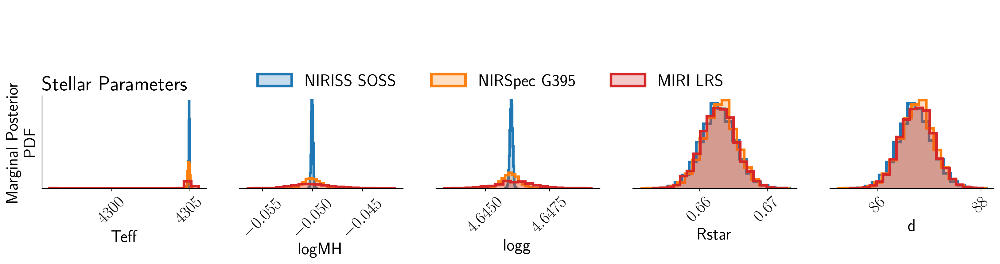

In [11]:
title1 = "NIRISS SOSS"
title2 = "NIRSpec G395"
title3 = "MIRI LRS"
labels = exopie_niriss.THETA_NAMES
truths = exopie_niriss.THETA0

i0 = 0
i1 = 5

fig, axes = plt.subplots(1, len(labels[i0:i1]), figsize = (20, 2))

for i in range(len(labels))[i0:i1]:
    ax = axes[i]
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.set_yticks([])
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)
    
    ax.set_xlabel(labels[i])
    #ax.set_title(r1.theta_names[i])
    
    if i > 0:
        ax.spines["left"].set_visible(False)
    else:
        ax.set_ylabel("Marginal Posterior \nPDF")
        ax.set_title("Stellar Parameters", loc="left")
    
    #ax.set_xlim(r1.theta_bounds[i])
    
    if i < len(labels):
        
        color = "C0"
        h1a = ax.hist(chain_niriss[:,i], bins = 20, density=True, histtype="step", lw = 3.0, color = color);
        h1b = ax.hist(chain_niriss[:,i], bins = 20, density=True, alpha = 0.25, color = color);
        
        color = "C1"
        h2a = ax.hist(chain_nirspec[:,i], bins = 20, density=True, histtype="step", lw = 3.0, color = color);
        h2b = ax.hist(chain_nirspec[:,i], bins = 20, density=True, alpha = 0.25, color = color);
        
        color = "C3"
        h3a = ax.hist(chain_mirilrs[:,i], bins = 20, density=True, histtype="step", lw = 3.0, color = color);
        h3b = ax.hist(chain_mirilrs[:,i], bins = 20, density=True, alpha = 0.25, color = color);
        
        #ax.axvline(truths[i], color = "k")
        

"""
ax = axes[-1]
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
ax.spines["left"].set_visible(False)
ax.set_yticks([])
ax.spines["bottom"].set_visible(False)
ax.set_xticks([])
"""

handles = [(h1a[2][0], h1b[2][0]), (h2a[2][0], h2b[2][0]), (h3a[2][0], h3b[2][0])]
labels = [title1, title2, title3]

fig.legend(handles, labels, bbox_to_anchor=(0.4, 1.3), loc = "lower center", ncol = 4, framealpha = 0.0);

#fig.savefig(retrieval.multinest_prefix+"pretty_marginals.png", bbox_inches = "tight")

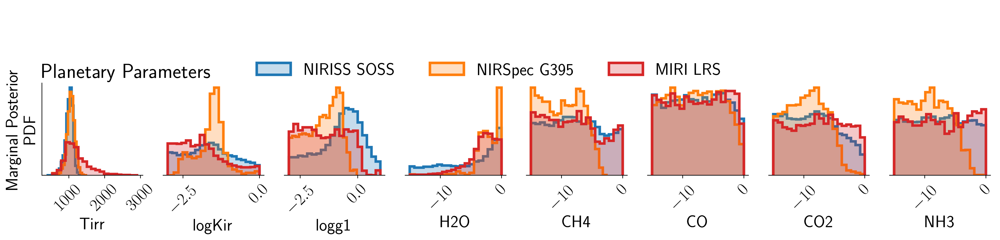

In [12]:
title1 = "NIRISS SOSS"
title2 = "NIRSpec G395"
title3 = "MIRI LRS"
labels = exopie_niriss.THETA_NAMES
truths = exopie_niriss.THETA0

i0 = 5
i1 = -1

fig, axes = plt.subplots(1, len(labels[i0:i1]), figsize = (20, 2))

j=0

for i in range(len(labels))[i0:i1]:
    ax = axes[j]
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.set_yticks([])
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)
    
    ax.set_xlabel(labels[i])
    #ax.set_title(r1.theta_names[i])
    
    if j > 0:
        ax.spines["left"].set_visible(False)
    else:
        ax.set_ylabel("Marginal Posterior \nPDF")
        ax.set_title("Planetary Parameters", loc="left")
    
    #ax.set_xlim(r1.theta_bounds[i])
    
    if i < len(labels):
        
        color = "C0"
        h1a = ax.hist(chain_niriss[:,i], bins = 20, density=True, histtype="step", lw = 3.0, color = color);
        h1b = ax.hist(chain_niriss[:,i], bins = 20, density=True, alpha = 0.25, color = color);
        
        color = "C1"
        h2a = ax.hist(chain_nirspec[:,i], bins = 20, density=True, histtype="step", lw = 3.0, color = color);
        h2b = ax.hist(chain_nirspec[:,i], bins = 20, density=True, alpha = 0.25, color = color);
        
        color = "C3"
        h3a = ax.hist(chain_mirilrs[:,i], bins = 20, density=True, histtype="step", lw = 3.0, color = color);
        h3b = ax.hist(chain_mirilrs[:,i], bins = 20, density=True, alpha = 0.25, color = color);
        
        #ax.axvline(truths[i], color = "k")
    
    j+=1
        

"""
ax = axes[-1]
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
ax.spines["left"].set_visible(False)
ax.set_yticks([])
ax.spines["bottom"].set_visible(False)
ax.set_xticks([])
"""

handles = [(h1a[2][0], h1b[2][0]), (h2a[2][0], h2b[2][0]), (h3a[2][0], h3b[2][0])]
labels = [title1, title2, title3]

fig.legend(handles, labels, bbox_to_anchor=(0.4, 1.2), loc = "lower center", ncol = 4, framealpha = 0.0);

#fig.savefig(retrieval.multinest_prefix+"pretty_marginals.png", bbox_inches = "tight")

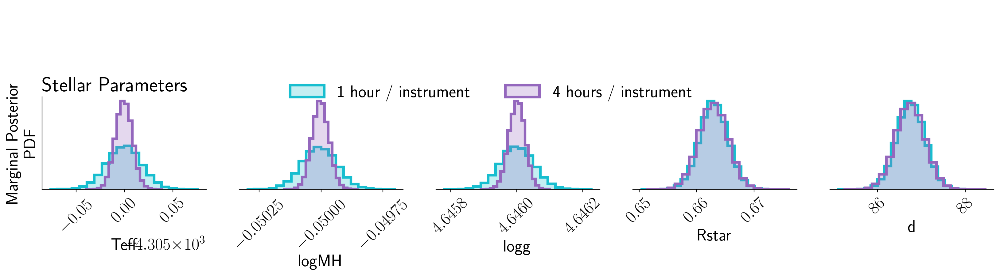

In [13]:
title1 = "1 hour / instrument"
title2 = "4 hours / instrument"
labels = exopie_all.THETA_NAMES
truths = exopie_all.THETA0

i0 = 0
i1 = 5

fig, axes = plt.subplots(1, len(labels[i0:i1]), figsize = (20, 2))

for i in range(len(labels))[i0:i1]:
    ax = axes[i]
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.set_yticks([])
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)
    
    ax.set_xlabel(labels[i])
    #ax.set_title(r1.theta_names[i])
    
    if i > 0:
        ax.spines["left"].set_visible(False)
    else:
        ax.set_ylabel("Marginal Posterior \nPDF")
        ax.set_title("Stellar Parameters", loc="left")
    
    #ax.set_xlim(r1.theta_bounds[i])
    
    if i < len(labels):
        
        color = "C9"
        h1a = ax.hist(chain_all[:,i], bins = 20, density=True, histtype="step", lw = 3.0, color = color);
        h1b = ax.hist(chain_all[:,i], bins = 20, density=True, alpha = 0.25, color = color);
        
        color = "C4"
        h2a = ax.hist(chain_all4[:,i], bins = 20, density=True, histtype="step", lw = 3.0, color = color);
        h2b = ax.hist(chain_all4[:,i], bins = 20, density=True, alpha = 0.25, color = color);
        

"""
ax = axes[-1]
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
ax.spines["left"].set_visible(False)
ax.set_yticks([])
ax.spines["bottom"].set_visible(False)
ax.set_xticks([])
"""

handles = [(h1a[2][0], h1b[2][0]), (h2a[2][0], h2b[2][0])]
labels = [title1, title2, title3]

fig.legend(handles, labels, bbox_to_anchor=(0.4, 1.3), loc = "lower center", ncol = 4, framealpha = 0.0);

#fig.savefig(retrieval.multinest_prefix+"pretty_marginals.png", bbox_inches = "tight")

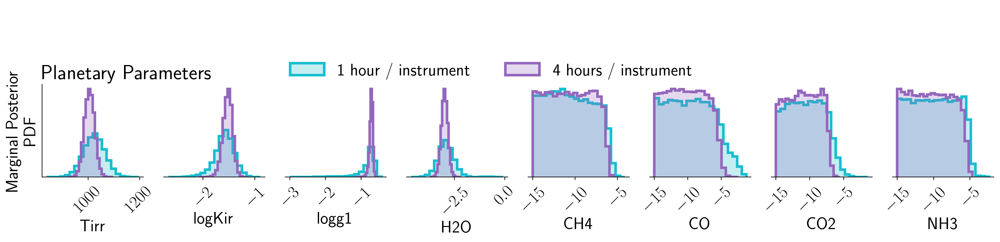

In [14]:
title1 = "1 hour / instrument"
title2 = "4 hours / instrument"
labels = exopie_all.THETA_NAMES
truths = exopie_all.THETA0

i0 = 5
i1 = -1

fig, axes = plt.subplots(1, len(labels[i0:i1]), figsize = (20, 2))

j=0

for i in range(len(labels))[i0:i1]:
    ax = axes[j]
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.set_yticks([])
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)
    
    ax.set_xlabel(labels[i])
    #ax.set_title(r1.theta_names[i])
    
    if j > 0:
        ax.spines["left"].set_visible(False)
    else:
        ax.set_ylabel("Marginal Posterior \nPDF")
        ax.set_title("Planetary Parameters", loc="left")
    
    #ax.set_xlim(r1.theta_bounds[i])
    
    if i < len(labels):
        
        color = "C9"
        h1a = ax.hist(chain_all[:,i], bins = 20, density=True, histtype="step", lw = 3.0, color = color);
        h1b = ax.hist(chain_all[:,i], bins = 20, density=True, alpha = 0.25, color = color);
        
        color = "C4"
        h2a = ax.hist(chain_all4[:,i], bins = 20, density=True, histtype="step", lw = 3.0, color = color);
        h2b = ax.hist(chain_all4[:,i], bins = 20, density=True, alpha = 0.25, color = color);
    
    j+=1
        

"""
ax = axes[-1]
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
ax.spines["left"].set_visible(False)
ax.set_yticks([])
ax.spines["bottom"].set_visible(False)
ax.set_xticks([])
"""

handles = [(h1a[2][0], h1b[2][0]), (h2a[2][0], h2b[2][0])]
labels = [title1, title2, title3]

fig.legend(handles, labels, bbox_to_anchor=(0.4, 1.2), loc = "lower center", ncol = 4, framealpha = 0.0);

#fig.savefig(retrieval.multinest_prefix+"pretty_marginals.png", bbox_inches = "tight")

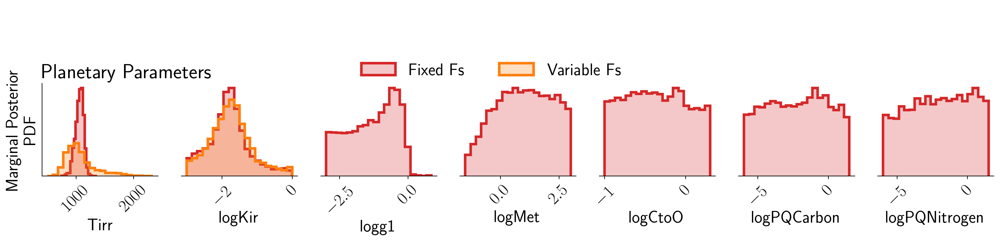

In [29]:
title1 = "MIRI LRS"
labels = exopie_miri_fixedFs.THETA_NAMES
truths = exopie_miri_fixedFs.THETA0

i0 = 0
i1 = -1

fig, axes = plt.subplots(1, len(labels[i0:i1]), figsize = (20, 2))

j=0

for i in range(len(labels))[i0:i1]:
    ax = axes[j]
    ax.spines["right"].set_visible(False)
    ax.spines["top"].set_visible(False)
    ax.set_yticks([])
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)
    
    ax.set_xlabel(labels[i])
    #ax.set_title(r1.theta_names[i])
    
    if j > 0:
        ax.spines["left"].set_visible(False)
    else:
        ax.set_ylabel("Marginal Posterior \nPDF")
        ax.set_title("Planetary Parameters", loc="left")
    
    #ax.set_xlim(r1.theta_bounds[i])
    
    if i < len(labels):
        
        color = "C3"
        h1a = ax.hist(chain_miri_fixedFs[:,i], bins = 20, density=True, histtype="step", lw = 3.0, color = color);
        h1b = ax.hist(chain_miri_fixedFs[:,i], bins = 20, density=True, alpha = 0.25, color = color);
        
        #ax.axvline(truths[i], color = "k")
    
    j+=1
        

"""
ax = axes[-1]
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)
ax.spines["left"].set_visible(False)
ax.set_yticks([])
ax.spines["bottom"].set_visible(False)
ax.set_xticks([])
"""

labels = exopie_mirilrs.THETA_NAMES
truths = exopie_mirilrs.THETA0

i0 = 5
i1 = -1

j=0

for i in range(len(labels))[i0:i1]:
    ax = axes[j]
    
    if j > 0:
        ax.spines["left"].set_visible(False)
    else:
        ax.set_ylabel("Marginal Posterior \nPDF")
        ax.set_title("Planetary Parameters", loc="left")
    
    #ax.set_xlim(r1.theta_bounds[i])
    
    if i < len(labels):
        
        color = "C1"
        h3a = ax.hist(chain_mirilrs[:,i], bins = 20, density=True, histtype="step", lw = 3.0, color = color);
        h3b = ax.hist(chain_mirilrs[:,i], bins = 20, density=True, alpha = 0.25, color = color);
        
        #ax.axvline(truths[i], color = "k")
    
    j+=1

handles = [(h1a[2][0], h1b[2][0]), (h3a[2][0], h3b[2][0])]
labels = ["Fixed Fs", "Variable Fs"]

fig.legend(handles, labels, bbox_to_anchor=(0.4, 1.2), loc = "lower center", ncol = 4, framealpha = 0.0);

#fig.savefig(retrieval.multinest_prefix+"pretty_marginals.png", bbox_inches = "tight")

## Table of 1-sigma results

In [15]:
d = dict(Parameters=exopie_niriss.THETA_NAMES, 
         Defaults=["$%s$" %s for s in exopie_niriss.THETA0])

df = pd.DataFrame(d)

df.head()

,Parameters,Defaults
0,Teff,$4305.0$
1,logMH,$-0.05$
2,logg,$4.646$
3,Rstar,$0.6629$
4,d,$86.7467$


In [16]:
# Specify the upper and lower 1- and 3-sigma confidence intervals for the spectra
s1 = 0.6827 # 1-sigma
s2 = 0.9545 # 2-sigma
s3 = 0.9973 # 3-sigma
q1 = [0.5 - 0.5*s1, 0.5, 0.5 + 0.5*s1] # 1-sigma quantiles

chains = [chain_niriss, chain_nirspec, chain_mirilrs, chain_all, chain_all4]
titles = ["NIRISS SOSS", "NIRSpec G395", "MIRI LRS", "all", "all 4"]
labels = exopie_niriss.THETA_NAMES

for i, chain in enumerate(chains):

    p_low, p_med, p_high = np.percentile(chain, list(100.0 * np.array(q1)), axis=0) # 1-sigma
    p_std = 0.5*(p_high - p_low)
    
    # Only std
    #df[titles[i]] = ["$%s$" %s for s in p_std]
    
    # Median with plus and minus 1 sigma intervals
    #"""
    text_full = []
    text_std = []
    for p, lo, hi, med in zip(labels, p_low, p_high, p_med):
        sigma = (hi - lo) / 2
        plus = hi - med
        minus = med - lo
        if sigma == 0:
            j = 3
        else:
            j = max(0, int(-np.floor(np.log10(sigma))) + 1)
        fmt = '%%.%df' % j
        fmts = '\t'.join(["$" + fmt + r"^{+"+fmt + r"}_{-"+ fmt + r"}$"])
        text_full.append(fmts % (med, plus, minus))
        text_std.append("$\pm %s$" %(fmt % sigma))
    #df[titles[i]] = text_full
    df[titles[i]] = text_std
    #"""

In [17]:
df.head()

,Parameters,Defaults,NIRISS SOSS,NIRSpec G395,MIRI LRS,all,all 4
0,Teff,$4305.0$,$\pm 0.020$,$\pm 0.065$,$\pm 0.16$,$\pm 0.018$,$\pm 0.0086$
1,logMH,$-0.05$,$\pm 0.000090$,$\pm 0.00080$,$\pm 0.0018$,$\pm 0.000069$,$\pm 0.000034$
2,logg,$4.646$,$\pm 0.000054$,$\pm 0.00031$,$\pm 0.00069$,$\pm 0.000050$,$\pm 0.000025$
3,Rstar,$0.6629$,$\pm 0.0025$,$\pm 0.0024$,$\pm 0.0025$,$\pm 0.0025$,$\pm 0.0025$
4,d,$86.7467$,$\pm 0.33$,$\pm 0.32$,$\pm 0.32$,$\pm 0.32$,$\pm 0.33$


In [18]:
print(df.to_latex(index=False, escape=False))

\begin{tabular}{lllllll}
\toprule
Parameters &   Defaults &     NIRISS SOSS &   NIRSpec G395 &       MIRI LRS &             all &           all 4 \\
\midrule
      Teff &   $4305.0$ &     $\pm 0.020$ &    $\pm 0.065$ &     $\pm 0.16$ &     $\pm 0.018$ &    $\pm 0.0086$ \\
     logMH &    $-0.05$ &  $\pm 0.000090$ &  $\pm 0.00080$ &   $\pm 0.0018$ &  $\pm 0.000069$ &  $\pm 0.000034$ \\
      logg &    $4.646$ &  $\pm 0.000054$ &  $\pm 0.00031$ &  $\pm 0.00069$ &  $\pm 0.000050$ &  $\pm 0.000025$ \\
     Rstar &   $0.6629$ &    $\pm 0.0025$ &   $\pm 0.0024$ &   $\pm 0.0025$ &    $\pm 0.0025$ &    $\pm 0.0025$ \\
         d &  $86.7467$ &      $\pm 0.33$ &     $\pm 0.32$ &     $\pm 0.32$ &      $\pm 0.32$ &      $\pm 0.33$ \\
      Tirr &     $1000$ &       $\pm 100$ &      $\pm 105$ &      $\pm 303$ &        $\pm 41$ &        $\pm 20$ \\
    logKir &     $-1.5$ &      $\pm 0.89$ &     $\pm 0.44$ &     $\pm 0.78$ &      $\pm 0.18$ &     $\pm 0.090$ \\
     logg1 &     $-0.7$ &       $\pm 

## Spectra

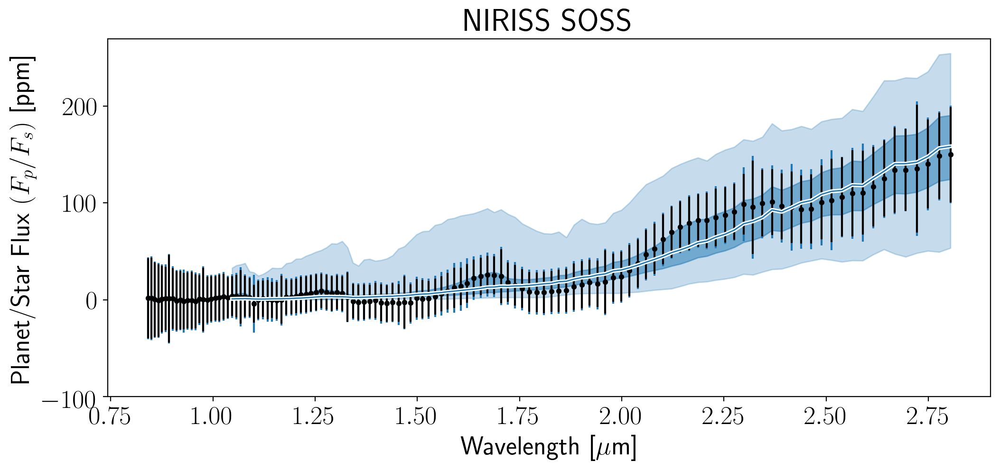

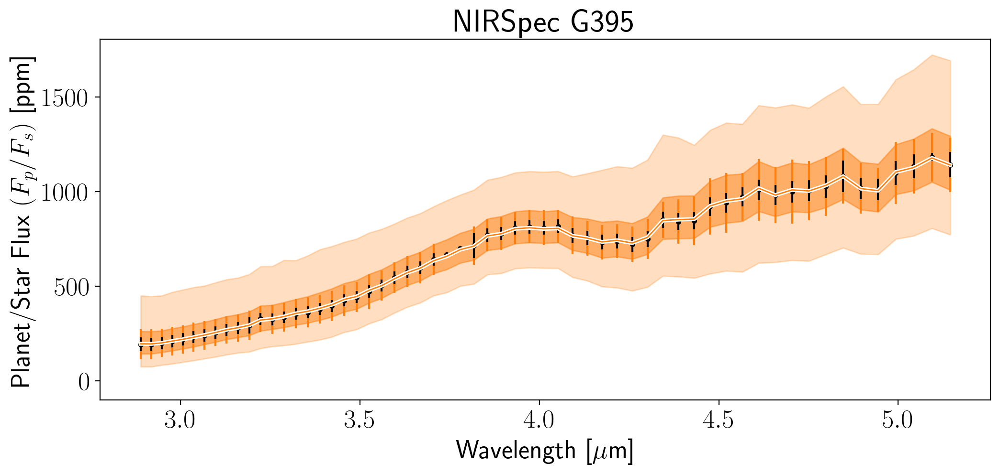

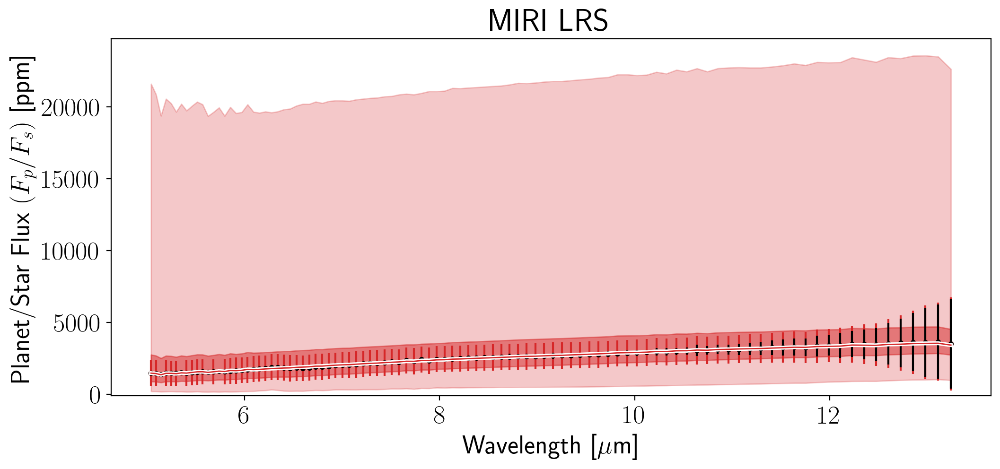

In [19]:
spectra = [spectra_niriss, spectra_nirspec, spectra_mirilrs]
titles = ["NIRISS SOSS", "NIRSpec G395", "MIRI LRS"]
colors = ["C0", "C1", "C3"]

#fig, ax = plt.subplots(figsize=(12,5))
#ax.set_ylabel("Planet/Star Flux $(F_p/F_s)$ [ppm]")
#ax.set_xlabel("Wavelength [$\mu$m]")

for i, spec in enumerate(spectra):
    
    fig, ax = plt.subplots(figsize=(12,5))
    ax.set_title(titles[i])
    ax.set_ylabel("Planet/Star Flux $(F_p/F_s)$ [ppm]")
    ax.set_xlabel("Wavelength [$\mu$m]")

    # Specify the upper and lower 1- and 3-sigma confidence intervals for the spectra
    s1 = 0.6827 # 1-sigma
    s2 = 0.9545 # 2-sigma
    s3 = 0.9973 # 3-sigma
    q1 = [0.5 - 0.5*s1, 0.5, 0.5 + 0.5*s1] # 1-sigma quantiles
    q3 = [0.5 - 0.5*s3, 0.5, 0.5 + 0.5*s3] # 3-sigma quantiles

    # Calculate percentile spectra (returns: lower bound, median, upper bound)
    Fobs_l_1, Fobs_50_1, Fobs_h_1 = np.percentile(spec['Fobs_post'], list(100.0 * np.array(q1)), axis=0) # 1-sigma
    Fobs_l_3, Fobs_50_3, Fobs_h_3 = np.percentile(spec['Fobs_post'], list(100.0 * np.array(q3)), axis=0) # 3-sigma

    Fstar_l_1, Fstar_50_1, Fstar_h_1 = np.percentile(spec['Fstar_post'], list(100.0 * np.array(q1)), axis=0) # 1-sigma
    Fstar_l_3, Fstar_50_3, Fstar_h_3 = np.percentile(spec['Fstar_post'], list(100.0 * np.array(q3)), axis=0) # 3-sigma

    Fplan_l_1, Fplan_50_1, Fplan_h_1 = np.percentile(spec['Fplan_post'], list(100.0 * np.array(q1)), axis=0) # 1-sigma
    Fplan_l_3, Fplan_50_3, Fplan_h_3 = np.percentile(spec['Fplan_post'], list(100.0 * np.array(q3)), axis=0) # 3-sigma

    FpFs_obs_l_1, FpFs_obs_50_1, FpFs_obs_h_1 = np.percentile(spec['y_meas']/spec['Fstar_post']-1.0, list(100.0 * np.array(q1)), axis=0) # 1-sigma
    FpFs_obs_l_3, FpFs_obs_50_3, FpFs_obs_h_3 = np.percentile(spec['y_meas']/spec['Fstar_post']-1.0, list(100.0 * np.array(q3)), axis=0) # 3-sigma
    FpFs_obs_std = 0.5*(FpFs_obs_h_1 - FpFs_obs_l_1)

    FpFs_l_1, FpFs_50_1, FpFs_h_1 = np.percentile(spec['Fobs_post']/spec['Fstar_post']-1.0, list(100.0 * np.array(q1)), axis=0) # 1-sigma
    FpFs_l_3, FpFs_50_3, FpFs_h_3 = np.percentile(spec['Fobs_post']/spec['Fstar_post']-1.0, list(100.0 * np.array(q3)), axis=0) # 3-sigma

    # Plot median spectrum
    l1 = ax.plot(spec['wl'], 1e6*FpFs_50_1, lw = 3.0, c="w", zorder = 100, alpha = 1.0)
    l2 = ax.plot(spec['wl'], 1e6*FpFs_50_1, lw = 1.0, c=colors[i], zorder = 100, alpha = 1.0, label = "median planet emission $\pm$ $1 \sigma$, $3 \sigma$")
    #ax2.plot(wl, 1e6*(Fobs/Fstar-1.0), color = "C3", label = "Retrieved Planet-to-Star Flux ($F_{pl}/F_{star}$)", zorder = 100)

    ylim = ax.get_ylim()
    ax.errorbar(spec['wl'], 1e6*(FpFs_obs_50_1), yerr = 1e6*np.sqrt((spec['y_err']/Fstar_50_1)**2 + (FpFs_obs_std)**2), fmt=".", color=colors[i])#, label = "propagated error from stellar model")
    ax.errorbar(spec['wl'], 1e6*(spec['y_meas']/Fstar_50_1-1.0), yerr = 1e6*(spec['y_err']/Fstar_50_1), fmt=".k", label = "data / median stellar model ($F_{obs} / F_{star} - 1$)")
    
    # Plot envelopes
    ax.fill_between(spec['wl'], 1e6*FpFs_l_1, 1e6*FpFs_h_1, color = colors[i], alpha = 0.5)
    ax.fill_between(spec['wl'], 1e6*FpFs_l_3, 1e6*FpFs_h_3, color = colors[i], alpha = 0.25)
    
    ax.set_ylim(bottom=-100)
    

(-100.0, 9973.28108230064)

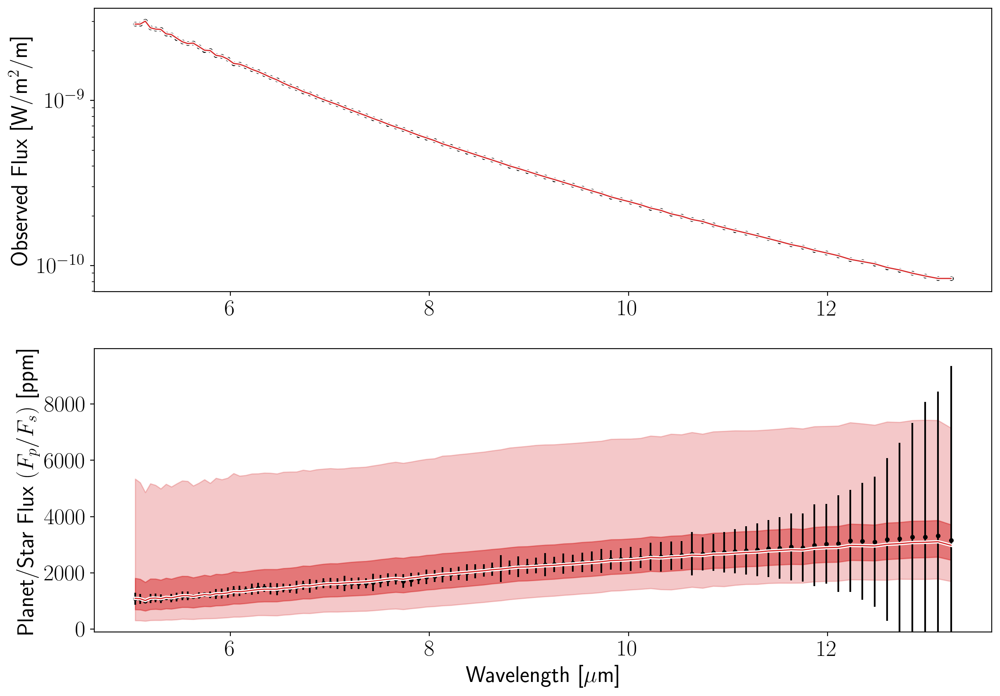

In [20]:
spectra = [spectra_mirilrs]#[spectra_niriss, spectra_nirspec, spectra_mirilrs]
titles = ["MIRI LRS"]#["NIRISS SOSS", "NIRSpec G395", "MIRI LRS"]
colors = ["C3"]#["C0", "C1", "C3"]

# Plot
fig, axes = plt.subplots(2,1, figsize = (14, 10))

axes[1].set_xlabel("Wavelength [$\mu$m]")
axes[0].set_ylabel("Observed Flux [W/m$^2$/m]")
axes[1].set_ylabel("Planet/Star Flux $(F_p/F_s)$ [ppm]")

for i, spec in enumerate(spectra):

    # Specify the upper and lower 1- and 3-sigma confidence intervals for the spectra
    s1 = 0.6827 # 1-sigma
    s2 = 0.9545 # 2-sigma
    s3 = 0.9973 # 3-sigma
    q1 = [0.5 - 0.5*s1, 0.5, 0.5 + 0.5*s1] # 1-sigma quantiles
    q3 = [0.5 - 0.5*s3, 0.5, 0.5 + 0.5*s3] # 3-sigma quantiles

    # Calculate percentile spectra (returns: lower bound, median, upper bound)
    Fobs_l_1, Fobs_50_1, Fobs_h_1 = np.percentile(spec['Fobs_post'], list(100.0 * np.array(q1)), axis=0) # 1-sigma
    Fobs_l_3, Fobs_50_3, Fobs_h_3 = np.percentile(spec['Fobs_post'], list(100.0 * np.array(q3)), axis=0) # 3-sigma

    Fstar_l_1, Fstar_50_1, Fstar_h_1 = np.percentile(spec['Fstar_post'], list(100.0 * np.array(q1)), axis=0) # 1-sigma
    Fstar_l_3, Fstar_50_3, Fstar_h_3 = np.percentile(spec['Fstar_post'], list(100.0 * np.array(q3)), axis=0) # 3-sigma

    Fplan_l_1, Fplan_50_1, Fplan_h_1 = np.percentile(spec['Fplan_post'], list(100.0 * np.array(q1)), axis=0) # 1-sigma
    Fplan_l_3, Fplan_50_3, Fplan_h_3 = np.percentile(spec['Fplan_post'], list(100.0 * np.array(q3)), axis=0) # 3-sigma

    FpFs_obs_l_1, FpFs_obs_50_1, FpFs_obs_h_1 = np.percentile(spec['y_meas']/spec['Fstar_post']-1.0, list(100.0 * np.array(q1)), axis=0) # 1-sigma
    FpFs_obs_l_3, FpFs_obs_50_3, FpFs_obs_h_3 = np.percentile(spec['y_meas']/spec['Fstar_post']-1.0, list(100.0 * np.array(q3)), axis=0) # 3-sigma
    FpFs_obs_std = 0.5*(FpFs_obs_h_1 - FpFs_obs_l_1)

    FpFs_l_1, FpFs_50_1, FpFs_h_1 = np.percentile(spec['Fobs_post']/spec['Fstar_post']-1.0, list(100.0 * np.array(q1)), axis=0) # 1-sigma
    FpFs_l_3, FpFs_50_3, FpFs_h_3 = np.percentile(spec['Fobs_post']/spec['Fstar_post']-1.0, list(100.0 * np.array(q3)), axis=0) # 3-sigma

    ax= axes[0]
    
    ax.plot(spec['wl'], Fobs_50_1, label = "Star + Planet (retrieved)", color = colors[i])
    
     # Plot median spectrum
    l1 = ax.plot(spec['wl'], Fobs_50_1, lw = 3.0, c="w", zorder = 100, alpha = 1.0)
    l2 = ax.plot(spec['wl'], Fobs_50_1, lw = 1.0, c=colors[i], zorder = 100, alpha = 1.0, label = "median observed flux $\pm$ $1 \sigma$, $3 \sigma$")
    
    ax.errorbar(spec['wl'], spec['y_meas'], yerr=spec['y_err'], fmt = ".k")
    
    # Plot envelopes
    ax.fill_between(spec['wl'], Fobs_l_1, Fobs_h_1, color = colors[i], alpha = 0.5)
    ax.fill_between(spec['wl'], Fobs_l_3, Fobs_h_3, color = colors[i], alpha = 0.25)
    
    #ax.plot(wl, Fstar_50_1 + 1000*Fplan_50_1, label = "Star + 1000x Planet thermal", color = "C1")

    ax.set_yscale("log")
    #ax.legend(fontsize = 16, loc = "lower left")

    #ax.axvspan(wl.min(), 1.6, color="C2", alpha = 0.1)
    #ax.text(1.2, 1.3e-7, "Reference\nWavelength\nRange", ha = "center", va = "top")

    #ax.text(4.0, 2e-7, "Planetary\nInfrared\nExcess", ha = "center", va = "center")
    #ax.annotate("", xy=(4.0, 2e-8), xytext=(4.0, 1e-7), arrowprops=dict(arrowstyle="->"))
    
    ax= axes[1]
    
    # Plot median spectrum
    l1 = ax.plot(spec['wl'], 1e6*FpFs_50_1, lw = 3.0, c="w", zorder = 100, alpha = 1.0)
    l2 = ax.plot(spec['wl'], 1e6*FpFs_50_1, lw = 1.0, c=colors[i], zorder = 100, alpha = 1.0, label = "median planet emission $\pm$ $1 \sigma$, $3 \sigma$")
    #ax2.plot(wl, 1e6*(Fobs/Fstar-1.0), color = "C3", label = "Retrieved Planet-to-Star Flux ($F_{pl}/F_{star}$)", zorder = 100)

    ylim = ax.get_ylim()
    ax.errorbar(spec['wl'], 1e6*(spec['y_meas']/Fstar_50_1-1.0), yerr = 1e6*(spec['y_err']/Fstar_50_1), fmt=".k", label = "data / median stellar model ($F_{obs} / F_{star} - 1$)")

    # Plot envelopes
    ax.fill_between(spec['wl'], 1e6*FpFs_l_1, 1e6*FpFs_h_1, color = colors[i], alpha = 0.5)
    ax.fill_between(spec['wl'], 1e6*FpFs_l_3, 1e6*FpFs_h_3, color = colors[i], alpha = 0.25)
    
ax.set_ylim(bottom=-100)

In [121]:
# Get random samples from posterior
chain = chain_all
exopie = exopie_all
Nsamples = 1000
inds = np.random.choice(np.arange(chain.shape[0]), size = Nsamples, replace = False)
theta_samples = chain[inds, :]

# Calculate the TP profile used to generate the data
# Make a dict of the current state
theta_dict = {}
#Unpacking Guillot 2010 TP profile params (3 params)
Tirr = theta_dict.get("Tirr", exopie.THETA_DEFAULTS["Tirr"])
logKir = theta_dict.get("logKir", exopie.THETA_DEFAULTS["logKir"])
logg1 = theta_dict.get("logg1", exopie.THETA_DEFAULTS["logg1"])
Tint = theta_dict.get("Tint", exopie.THETA_DEFAULTS["Tint"])
#unpacking planet params
Rp = theta_dict.get("Rp", exopie.THETA_DEFAULTS["Rp"])  #planet radius (in jupiter)
M = theta_dict.get("M", exopie.THETA_DEFAULTS["M"])     #planet mass (in jupiter)
# Calculate TP profile
logP = np.arange(-6.8,1.5,0.1)+0.1
P = 10.0**logP
g0=6.67384e-11*M*1.898E27/(Rp*71492.*1e3)**2
kv=10.**(logg1+logKir)
kth=10.**logKir
tp=chimera.fm.TP(Tirr, Tint,g0 , kv, kv, kth, 0.5)
T = np.interp(logP,np.log10(tp[1]),tp[0])
Ttrue=0.5*(T[1:]+T[:-1])
Pavg=0.5*(P[1:]+P[:-1])

# Run model at points
Ts = []
for i, t in enumerate(theta_samples):

    # Make a dict of the current state
    theta_dict = dict(zip(exopie.THETA_NAMES, t))

    #Unpacking Guillot 2010 TP profile params (3 params)
    Tirr = theta_dict.get("Tirr", exopie.THETA_DEFAULTS["Tirr"])
    logKir = theta_dict.get("logKir", exopie.THETA_DEFAULTS["logKir"])
    logg1 = theta_dict.get("logg1", exopie.THETA_DEFAULTS["logg1"])
    Tint = theta_dict.get("Tint", exopie.THETA_DEFAULTS["Tint"])

    #unpacking planet params
    Rp = theta_dict.get("Rp", exopie.THETA_DEFAULTS["Rp"])  #planet radius (in jupiter)
    M = theta_dict.get("M", exopie.THETA_DEFAULTS["M"])     #planet mass (in jupiter)

    # Calculate TP profile
    logP = np.arange(-6.8,1.5,0.1)+0.1
    P = 10.0**logP
    g0=6.67384e-11*M*1.898E27/(Rp*71492.*1e3)**2
    kv=10.**(logg1+logKir)
    kth=10.**logKir
    tp=chimera.fm.TP(Tirr, Tint,g0 , kv, kv, kth, 0.5)
    T = np.interp(logP,np.log10(tp[1]),tp[0])
    Tavg=0.5*(T[1:]+T[:-1])
    Pavg=0.5*(P[1:]+P[:-1])
    
    Ts.append(Tavg)
    
Ts = np.array(Ts)

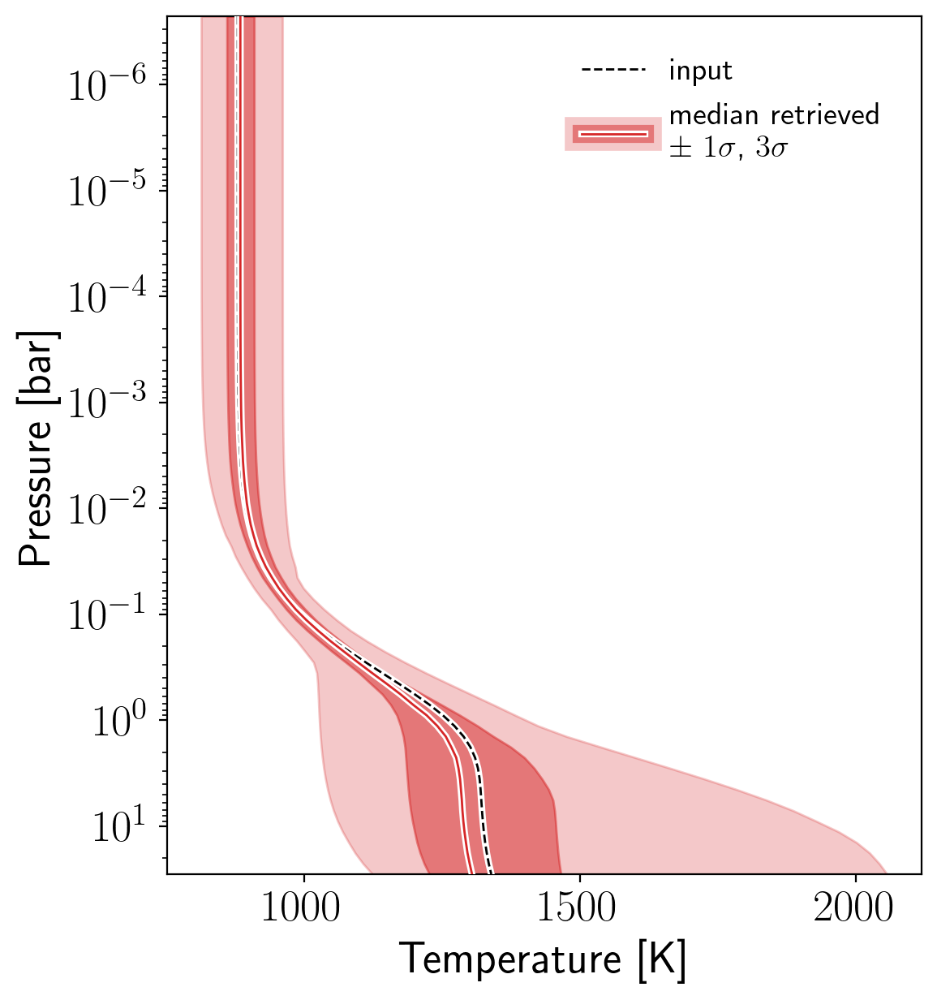

In [122]:
# Specify the upper and lower 1- and 3-sigma confidence intervals for the spectra
s1 = 0.6827 # 1-sigma
s2 = 0.9545 # 2-sigma
s3 = 0.9973 # 3-sigma
q1 = [0.5 - 0.5*s1, 0.5, 0.5 + 0.5*s1] # 1-sigma quantiles
q3 = [0.5 - 0.5*s3, 0.5, 0.5 + 0.5*s3] # 3-sigma quantiles

# Calculate percentile spectra (returns: lower bound, median, upper bound)
T_l_1, T_50_1, T_h_1 = np.percentile(Ts, list(100.0 * np.array(q1)), axis=0) # 1-sigma
T_l_3, T_50_3, T_h_3 = np.percentile(Ts, list(100.0 * np.array(q3)), axis=0) # 3-sigma

color = "C3"

fig, ax = plt.subplots(figsize=(6,7))
ax.set_ylabel("Pressure [bar]")
ax.set_xlabel("Temperature [K]")

lt1, = ax.plot(Ttrue, Pavg, lw = 3.0, c="w", zorder = 100, alpha = 1.0)
lt2, = ax.plot(Ttrue, Pavg, lw = 1.0, c="k", zorder = 100, alpha = 1.0, ls = "dashed")

# Plot median TP
lm1, = ax.plot(T_50_1, Pavg, lw = 3.0, c="w", zorder = 100, alpha = 1.0)
lm2, = ax.plot(T_50_1, Pavg, lw = 1.0, c=color, zorder = 100, alpha = 1.0)

# Plot TP envelopes
ax.fill_betweenx(Pavg, T_l_1, T_h_1, color = color, alpha = 0.5)
ax.fill_betweenx(Pavg, T_l_3, T_h_3, color = color, alpha = 0.25)

# Create fake lines to use in custom legend
p1 = mpl.lines.Line2D([0], [0], color=color, alpha=0.5, linewidth=8)
p2 = mpl.lines.Line2D([0], [0], color=color, alpha=0.25, linewidth=15)

ax.invert_yaxis()
ax.set_yscale("log")
ax.set_ylim(Pavg.max(), Pavg.min())

handles = [(lt1, lt2), (p1, p2, lm1, lm2)]
labels = ["input", "median retrieved \n$\pm$ $1 \sigma$, $3 \sigma$"]

ax.legend(handles, labels, fontsize = 14, borderpad = 0.75, framealpha = 0.0)

## Non-transiting Radius Constraints

### All Instruments

In [35]:
d = dict(Parameters=exopie_nontrans_1.THETA_NAMES, 
         Defaults=["$%s$" %s for s in exopie_nontrans_1.THETA0])

df = pd.DataFrame(d)

# Specify the upper and lower 1- and 3-sigma confidence intervals for the spectra
s1 = 0.6827 # 1-sigma
s2 = 0.9545 # 2-sigma
s3 = 0.9973 # 3-sigma
q1 = [0.5 - 0.5*s1, 0.5, 0.5 + 0.5*s1] # 1-sigma quantiles

chains = [chain_nontran025, chain_nontran1, chain_nontran4]
eps = [exopie_nontrans_025, exopie_nontrans_1, exopie_nontrans_4]
titles = ["0.25 hours", "1 hour", "4 hours"]
labels = exopie_nontrans_1.THETA_NAMES

for i, chain in enumerate(chains):

    p_low, p_med, p_high = np.percentile(chain, list(100.0 * np.array(q1)), axis=0) # 1-sigma
    p_std = 0.5*(p_high - p_low)
    
    # Only std
    #df[titles[i]] = ["$%s$" %s for s in p_std]
    
    # Median with plus and minus 1 sigma intervals
    #"""
    text_full = []
    text_std = []
    for p, lo, hi, med in zip(labels, p_low, p_high, p_med):
        sigma = (hi - lo) / 2
        plus = hi - med
        minus = med - lo
        if sigma == 0:
            j = 3
        else:
            j = max(0, int(-np.floor(np.log10(sigma))) + 1)
        fmt = '%%.%df' % j
        fmts = '\t'.join(["$" + fmt + r"^{+"+fmt + r"}_{-"+ fmt + r"}$"])
        text_full.append(fmts % (med, plus, minus))
        text_std.append("$\pm %s$" %(fmt % sigma))
    #df[titles[i]] = text_full
    df[titles[i]] = text_std
    #"""

In [36]:
df

,Parameters,Defaults,0.25 hours,1 hour,4 hours
0,Teff,$4305.0$,$\pm 0.035$,$\pm 0.017$,$\pm 0.0087$
1,logMH,$-0.05$,$\pm 0.00014$,$\pm 0.000068$,$\pm 0.000034$
2,logg,$4.646$,$\pm 0.000098$,$\pm 0.000049$,$\pm 0.000025$
3,Rstar,$0.6629$,$\pm 0.0026$,$\pm 0.0025$,$\pm 0.0025$
4,d,$86.7467$,$\pm 0.34$,$\pm 0.32$,$\pm 0.33$
5,Tirr,$1000$,$\pm 61$,$\pm 43$,$\pm 20$
6,logKir,$-1.5$,$\pm 0.35$,$\pm 0.18$,$\pm 0.088$
7,logg1,$-0.7$,$\pm 0.86$,$\pm 0.17$,$\pm 0.045$
8,H2O,$-3.0$,$\pm 1.5$,$\pm 0.38$,$\pm 0.16$
9,CH4,$-8.0$,$\pm 3.5$,$\pm 3.1$,$\pm 3.0$


17.0179139869817 1.3833590000673008
17.0179139869817 1.3833590000673008
17.0179139869817 1.3833590000673008


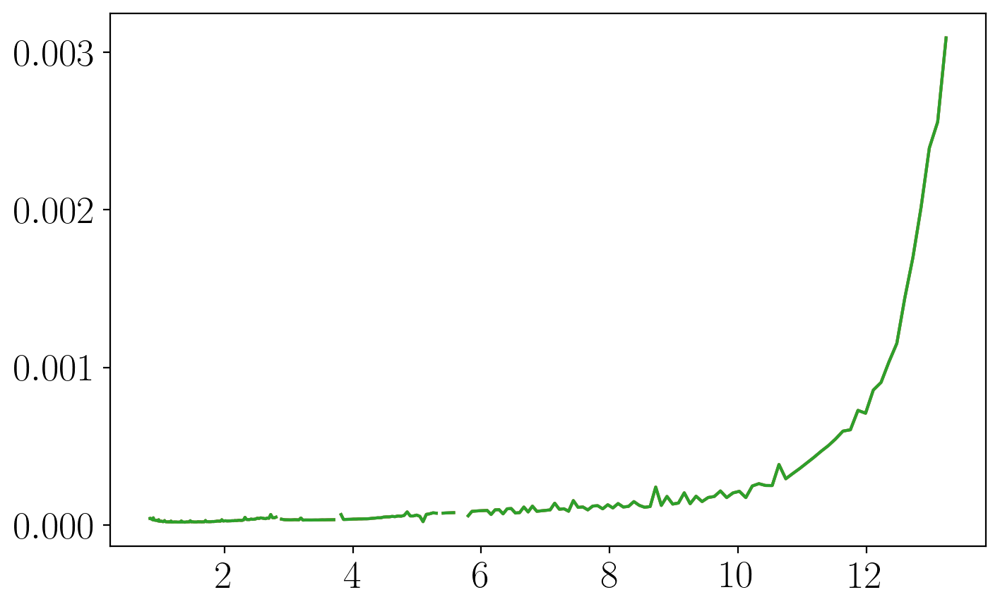

In [41]:
for ep in eps:
    # Calculate the precision
    precision = ep.y_err / ep.y_binned
    imin = np.nanargmin(precision)
    print(precision[imin] * 1e6, ep.wl[imin])
    plt.plot(ep.wl, precision)

In [58]:
# Define data and xsecs
tags = ["test_free_allinpt25_nontrans", "test_free_allin1_nontrans", "test_free_allin4_nontrans"]
texps = np.array([0.25, 1.0, 4.0])
precisions = []
sigmaRps = np.zeros(len(texps))

for i, tag in enumerate(tags): 
    
    # Load data file
    data_tag = "../../CHIMERA/exoPIE/w43b_exopie_data_%s" %tag
    print("Loading Synthetic Data and xsecs...")
    data = np.load(data_tag+".npz", allow_pickle=True)
    wl=data["wl"]
    y_binned=data["y_binned"]
    y_meas=data["y_meas"]
    y_err=data["y_err"]
    XSECS=data["xsecs"]
    
    # Calculate the precision
    precision = y_err / y_binned
    
    precisions.append(precision)
    
    sigmaRps[i] = np.std(chains[i][:,-1])

precisions=np.array(precisions)
    

Loading Synthetic Data and xsecs...
Loading Synthetic Data and xsecs...
Loading Synthetic Data and xsecs...


In [141]:
for i in range(len(tags)):
    imin = np.nanargmin(precisions[i])
    print(precisions[i][imin] * 1e6, "at", wl[imin], "µm")

68.0716559479268 at 1.3833590000673008 µm
34.0358279739634 at 1.3833590000673008 µm
17.0179139869817 at 1.3833590000673008 µm


In [150]:
i5mu = np.argmin(np.fabs(wl - 5.0))

In [185]:
iuse = i5mu#imin

# Use minimum precision wavelength 
ppm = precisions[:,iuse] * 1e6

In [186]:
def model(theta, x=texps):
    return theta[0]*(x**-0.5) + theta[1]

theta0 = np.ones(2)   

def func(theta, x=texps):
    mod = model(theta, x=x)
    return np.sum((ppm - mod)**2)

result = sp.optimize.minimize(func, theta0)

print(result)

theta_best = result.x
mod = model(theta_best)

      fun: 2.8605377908460977e-13
 hess_inv: array([[ 0.42854593, -0.49999857],
       [-0.49999857,  0.74999992]])
      jac: array([2.52897517e-06, 1.57795414e-06])
  message: 'Optimization terminated successfully.'
     nfev: 24
      nit: 5
     njev: 8
   status: 0
  success: True
        x: array([ 1.25103566e+02, -8.37882603e-09])


In [187]:
x = np.linspace(0.2, 5, 100)
y = model(theta_best, x=x)

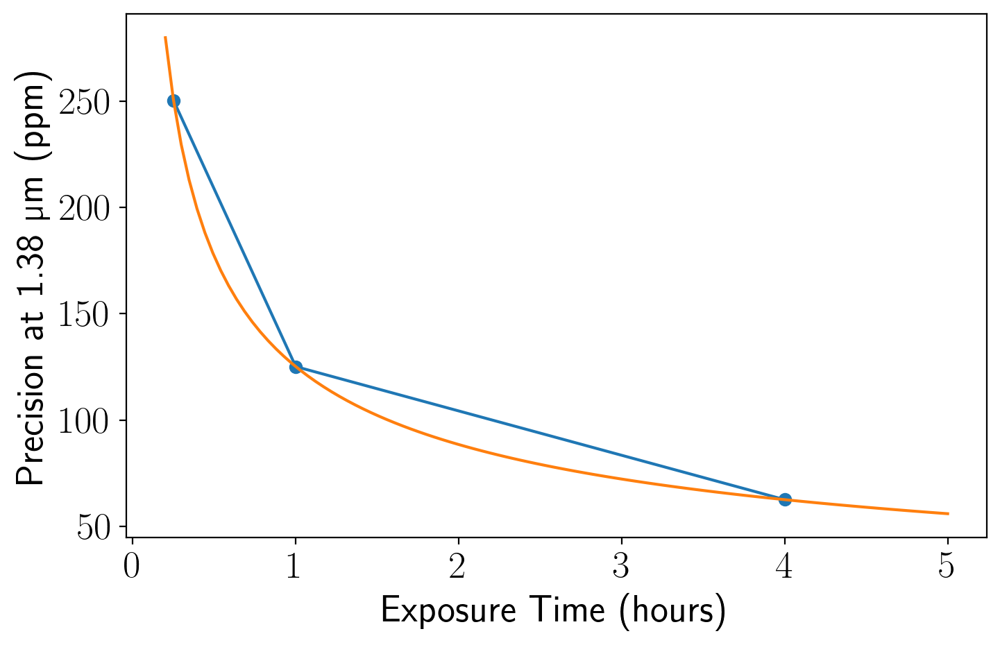

In [188]:
fig, ax = plt.subplots()
ax.set_xlabel("Exposure Time (hours)")
ax.set_ylabel("Precision at 1.38 µm (ppm)")
ax.plot(texps, ppm, "o-")
ax.plot(x,y)

In [189]:
def model2(theta, x=ppm):
    return theta[0]*x + theta[1]

theta0 = np.ones(2)   

def func2(theta, x=ppm):
    mod = model2(theta, x=x)
    return np.sum((sigmaRps - mod)**2)

result = sp.optimize.minimize(func2, theta0)

print(result)

theta_best2 = result.x
mod2 = model2(theta_best2)

      fun: 3.9085859890668963e-07
 hess_inv: array([[ 2.74172771e-05, -4.00812467e-03],
       [-4.00812467e-03,  7.53835303e-01]])
      jac: array([-8.74628721e-07, -7.68421415e-09])
  message: 'Optimization terminated successfully.'
     nfev: 24
      nit: 7
     njev: 8
   status: 0
  success: True
        x: array([0.00020188, 0.00129706])


In [190]:
x2 = np.linspace(1, 100, 100)
y2 = model2(theta_best2, x=x2)

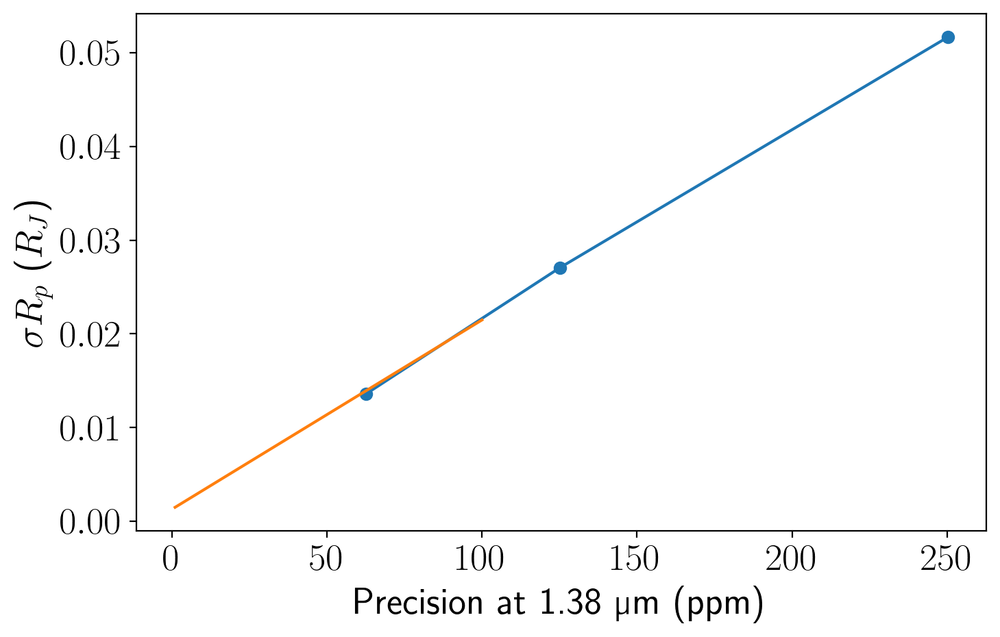

In [191]:
fig, ax = plt.subplots()
ax.set_xlabel("Precision at 1.38 µm (ppm)")
ax.set_ylabel("$\sigma R_p$ ($R_J$)")
ax.plot(ppm, sigmaRps, "o-")
ax.plot(x2,y2)

In [192]:
noise_floor = 10.0
sigmaRp_best = model2(theta_best2, x=noise_floor)

print("A noise floor of %i ppm (at %.2f µm) corresponds to a one-sigma radius constraint of %.4f Jupiter radii." %(noise_floor, wl[iuse], sigmaRp_best))

texp_floor = ((noise_floor - theta_best[1]) / theta_best[0])**-2

print("Observations longer than %.1f hours will run up against a %i ppm noise floor and may no longer improve the radius constraint." %(texp_floor, noise_floor))

A noise floor of 10 ppm (at 4.99 µm) corresponds to a one-sigma radius constraint of 0.0033 Jupiter radii.
Observations longer than 156.5 hours will run up against a 10 ppm noise floor and may no longer improve the radius constraint.


consider band-integrated noise, determine noise floor for this. 

### Individual Instruments

In [8]:
d = dict(Parameters=exopie_nontrans_1.THETA_NAMES, 
         Defaults=["$%s$" %s for s in exopie_nontrans_1.THETA0])

df = pd.DataFrame(d)

# Specify the upper and lower 1- and 3-sigma confidence intervals for the spectra
s1 = 0.6827 # 1-sigma
s2 = 0.9545 # 2-sigma
s3 = 0.9973 # 3-sigma
q1 = [0.5 - 0.5*s1, 0.5, 0.5 + 0.5*s1] # 1-sigma quantiles

chains = [chain_nontran1, chain_nontran_niriss1, chain_nontran_nirspec1, chain_nontran_miri1]
eps = [exopie_nontrans_1, exopie_nontrans_niriss1, exopie_nontrans_nirspec1, exopie_nontrans_miri1]
titles = ["All", "NIRISS", "NIRSpec", "MIRI"]
labels = exopie_nontrans_1.THETA_NAMES

for i, chain in enumerate(chains):

    p_low, p_med, p_high = np.percentile(chain, list(100.0 * np.array(q1)), axis=0) # 1-sigma
    p_std = 0.5*(p_high - p_low)
    
    # Only std
    #df[titles[i]] = ["$%s$" %s for s in p_std]
    
    # Median with plus and minus 1 sigma intervals
    #"""
    text_full = []
    text_std = []
    for p, lo, hi, med in zip(labels, p_low, p_high, p_med):
        sigma = (hi - lo) / 2
        plus = hi - med
        minus = med - lo
        if sigma == 0:
            j = 3
        else:
            j = max(0, int(-np.floor(np.log10(sigma))) + 1)
        fmt = '%%.%df' % j
        fmts = '\t'.join(["$" + fmt + r"^{+"+fmt + r"}_{-"+ fmt + r"}$"])
        text_full.append(fmts % (med, plus, minus))
        text_std.append("$\pm %s$" %(fmt % sigma))
    #df[titles[i]] = text_full
    df[titles[i]] = text_std
    #"""

In [9]:
df

,Parameters,Defaults,All,NIRISS,NIRSpec,MIRI
0,Teff,$4305.0$,$\pm 0.017$,$\pm 0.020$,$\pm 0.065$,$\pm 0.16$
1,logMH,$-0.05$,$\pm 0.000068$,$\pm 0.000090$,$\pm 0.00090$,$\pm 0.0020$
2,logg,$4.646$,$\pm 0.000049$,$\pm 0.000054$,$\pm 0.00036$,$\pm 0.00080$
3,Rstar,$0.6629$,$\pm 0.0025$,$\pm 0.0025$,$\pm 0.0026$,$\pm 0.0025$
4,d,$86.7467$,$\pm 0.32$,$\pm 0.33$,$\pm 0.34$,$\pm 0.33$
5,Tirr,$1000$,$\pm 43$,$\pm 165$,$\pm 204$,$\pm 453$
6,logKir,$-1.5$,$\pm 0.18$,$\pm 0.93$,$\pm 0.49$,$\pm 0.77$
7,logg1,$-0.7$,$\pm 0.17$,$\pm 1.00$,$\pm 0.58$,$\pm 1.1$
8,H2O,$-3.0$,$\pm 0.38$,$\pm 5.5$,$\pm 1.5$,$\pm 2.0$
9,CH4,$-8.0$,$\pm 3.1$,$\pm 5.1$,$\pm 3.5$,$\pm 4.4$


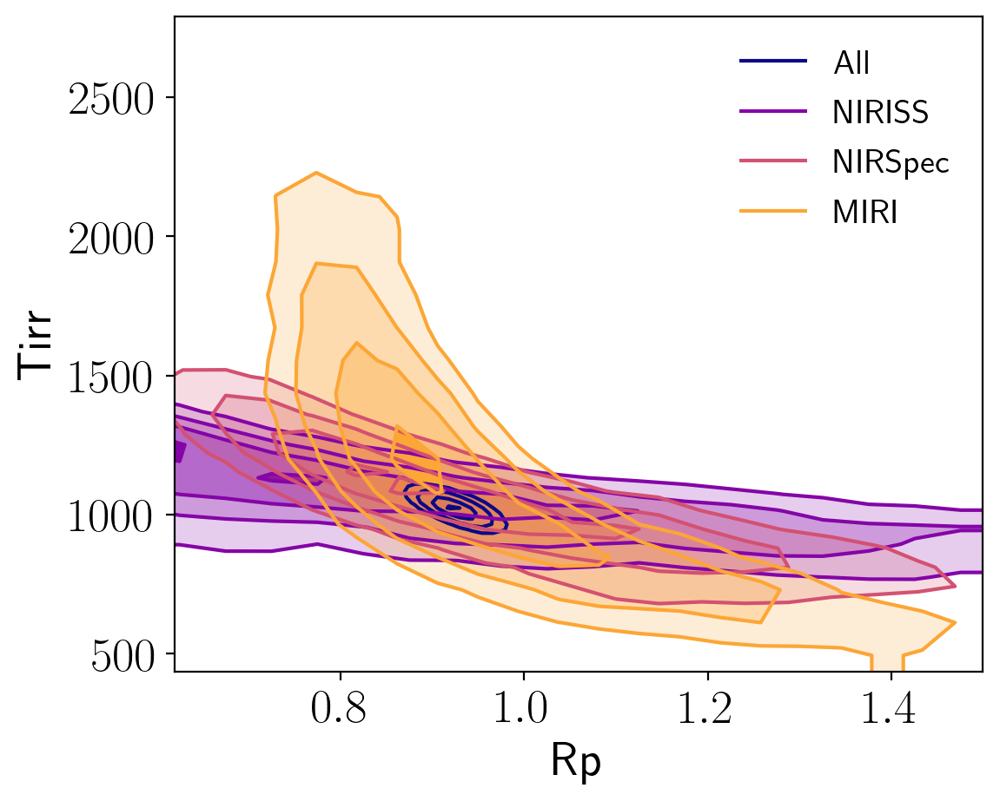

In [42]:
fig, ax = plt.subplots(figsize = (6,5))

chains = [chain_nontran1, chain_nontran_niriss1, chain_nontran_nirspec1, chain_nontran_miri1]
eps = [exopie_nontrans_1, exopie_nontrans_niriss1, exopie_nontrans_nirspec1, exopie_nontrans_miri1]
titles = ["All", "NIRISS", "NIRSpec", "MIRI"]
labels = exopie_nontrans_1.THETA_NAMES

ix = 13
iy = 5

smooth = 0.6

colors = plt.cm.plasma(np.linspace(0.0,0.8,len(titles)))

ax.set_xlabel(labels[ix])
ax.set_ylabel(labels[iy])

for i in range(len(titles)):
    color = colors[i]
    corner.hist2d(chains[i][:,ix], chains[i][:,iy], ax=ax, 
                  smooth = smooth, color = color, no_fill_contours=True, plot_datapoints=False, 
                  fill_contours=True)

#"""
children = ax.get_children()
lines = []
for c in children:
    if c.__class__.__name__ == "LineCollection":
        lines.append(c)

ax.legend([line for line in lines[::4]], [title for title in titles], framealpha = 0.0, fontsize=14)
#"""

#ax.legend()

#fig.savefig(r1.multinest_prefix+"refraction_single_pairs.png", bbox_inches = "tight")

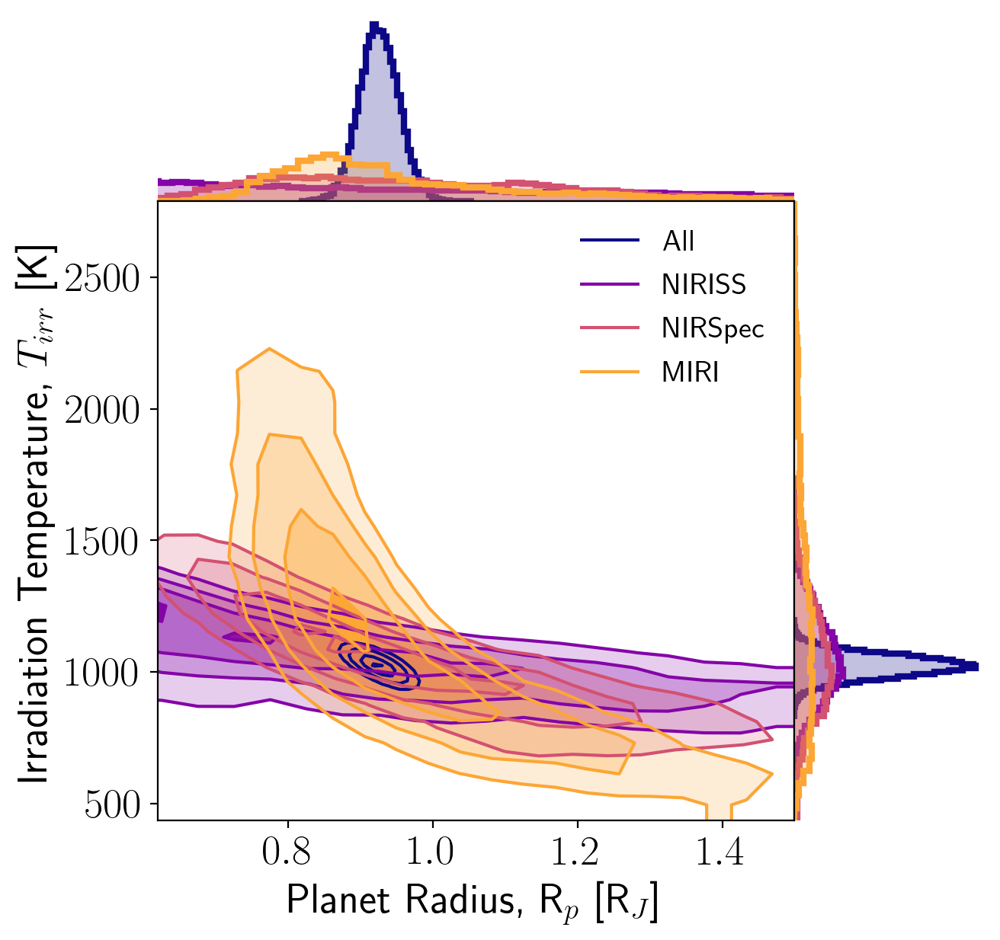

In [54]:
fig, axes = plt.subplots(2,2, figsize = (7,7),  
                         gridspec_kw={"width_ratios" : [1, 0.3], 
                                      "height_ratios" : [0.3, 1.0], 
                                      "wspace" : 0.0, 
                                      "hspace" : 0.0})

axes[0,1].axis('off')

ax = axes[1,0] 
chains = [chain_nontran1, chain_nontran_niriss1, chain_nontran_nirspec1, chain_nontran_miri1]
eps = [exopie_nontrans_1, exopie_nontrans_niriss1, exopie_nontrans_nirspec1, exopie_nontrans_miri1]
titles = ["All", "NIRISS", "NIRSpec", "MIRI"]
labels = exopie_nontrans_1.THETA_NAMES

ix = 13
iy = 5

smooth = 0.6

colors = plt.cm.plasma(np.linspace(0.0,0.8,len(titles)))

#ax.set_xlabel(labels[ix])
#ax.set_ylabel(labels[iy])

ax.set_xlabel("Planet Radius, R$_p$ [R$_{J}$]")
ax.set_ylabel("Irradiation Temperature, $T_{irr}$ [K]")

for i in range(len(titles)):
    color = colors[i]
    corner.hist2d(chains[i][:,ix], chains[i][:,iy], ax=ax, 
                  smooth = smooth, color = color, no_fill_contours=True, plot_datapoints=False, 
                  fill_contours=True)

#ax.set_xlim(90, 410)
#ax.set_ylim(0.0, 50.0)

#"""
children = ax.get_children()
lines = []
for c in children:
    if c.__class__.__name__ == "LineCollection":
        lines.append(c)

ax.legend([line for line in lines[::4]], [title for title in titles], framealpha = 0.0, fontsize=14)
#"""

xlims = ax.get_xlim()
ylims = ax.get_ylim()

ax = axes[0,0]

for i in range(len(titles)):
    color = colors[i]
    hi = ax.hist(chains[i][:,ix], bins = 50, density=True, histtype="step", lw = 3.0, color = color);
    hi = ax.hist(chains[i][:,ix], bins = 50, density=True, alpha = 0.25, color = color);

ax.set_xlim(xlims)
ax.set_yticks([])
ax.set_xticks([])
ax.spines["left"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)

#"""
#handles = [(h2a[2][0], h2b[2][0]), (h1a[2][0], h1b[2][0]), (h3a[2][0], h3b[2][0]), (h4a[2][0], h4b[2][0])]
#labels = [r"\ce{N2} filling", r"\ce{Ar} filling", r"\ce{H2} filling", r"$\mu$ free"]

#ax.legend(handles, labels, ncol = 1, framealpha = 0.0, fontsize = 16, bbox_to_anchor = (0.99, 1.0), loc = "upper left");
#ax.set_title("VMR filling")
#"""

ax = axes[1,1]

for i in range(len(titles)):
    color = colors[i]
    hi = ax.hist(chains[i][:,iy], bins = 50, density=True, histtype="step", lw = 3.0, color = color, orientation='horizontal');
    hi = ax.hist(chains[i][:,iy], bins = 50, density=True, alpha = 0.25, color = color, orientation='horizontal');

ax.set_ylim(ylims)
ax.set_yticks([])
ax.set_xticks([])
ax.spines["bottom"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.spines["top"].set_visible(False)

fig.savefig("/Users/lustija1/Documents/exoPIE_IRAD/W43b_PIE_retrieval_free_Tirr_vs_Rp.png", bbox_inches = "tight")